# Index  <a name = "index"></a>
1. [Introduction](#intro)
2. [Dealing with the Labels Issue](#dli)
3. [Discretization](#discretization)

# Introduction <a name = "intro"></a>
[[go back to Index]](#index)

After a detailed analysis of the CSVs provided for this project and a thorough reading of the project statement, we defined the following structure as a draft of the Bayesian network:

    Bearing Wear ------> Vibration -----------------                
                                                    \               
    Fan Fault --------------                         \              
                            \                         \             
                            Spindle Temperature -------  Overheat   
                            /                         /             
    Cooling Efficiency -----                         /              
                                                    /               
    Clogged Filter ------> Coolant Flow ------------                
                                                                    
    |----------------|   |------------------------|    |----------| 
      Latent Causes       Sensor Values (observed)        Target    

In this project it is natural to divide the Bayesian network into two conceptual parts:

1. A sub-network that only contains **observable variables**, trained with **Maximum Likelihood Estimation (MLE)**;
2. The full network, where we **add the latent (unobserved) causes** and then **train the remaining parameters with the Expectation–Maximisation (EM)** algorithm.

The main reason for this separation is that MLE works best when all variables in the model are directly observed in the data. In the lower part of the network we have quantities such as sensor-based symptoms and the overheat label, which can be measured or constructed from telemetry. For this sub-network, the conditional probability tables can be estimated simply by counting how often each configuration of parent and child values occurs in the data. This gives closed-form MLE estimates that are easy to compute, statistically efficient, and relatively robust. It also allows us to anchor the model on patterns that we genuinely see in the data, rather than relying on guesses.

The latent cause nodes are different. They are never observed directly, so there are no straightforward frequency counts we can use for MLE. If we tried to learn the whole network in one step, every parameter involving a latent node would have to be inferred indirectly, which makes optimisation harder, slower, and more sensitive to initialisation. Introducing EM only at this stage is a principled way to handle the missing information: in the E-step, the algorithm uses the current parameters to infer a probability distribution over the latent causes; in the M-step, it updates the parameters as if those inferred values were soft observations.

By first training the observable part with MLE and only then extending to the latent structure with EM, we obtain several benefits:
- The parameters for the observed relationships are grounded in real data before we start inferring hidden structure;
- EM has a better starting point, which improves convergence and reduces the risk of poor local optima;
- The overall learning problem is decomposed into a simple, fully observed phase and a more complex, partially observed phase, making the workflow clearer and easier to justify in the report.

In short, splitting the Bayesian network in this way respects the distinction between what is directly measured and what is inferred, uses the most appropriate estimation method for each case, and leads to a more stable and interpretable model.

In [1]:
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
from matplotlib.patches import Patch
from sklearn.tree import DecisionTreeClassifier, export_text
import numpy as np

In [2]:
from src.bn_pre_processing import *

In [3]:
merged_data = pd.read_csv("data/merged_data.csv")
merged_data["timestamp"] = pd.to_datetime(merged_data["timestamp"])
merged_data = merged_data.sort_values(["machine_id", "timestamp"])
merged_data = merged_data[["machine_id", "timestamp", "spindle_temp", "vibration_rms", "coolant_flow", "spindle_overheat"]]

In [4]:
maintenance = pd.read_csv("data/maintenance.csv")
maintenance["timestamp"] = pd.to_datetime(maintenance["timestamp"])
maintenance = maintenance.sort_values(["machine_id", "timestamp"])

# Dealing with the Labels Issue <a name = "dli"></a>
[[go back to Index]](#index)

The dataset does not provide reliable positive labels for spindle overheating, as the **`spindle_overheat` variable is always zero**. This prevents the direct use of standard supervised learning techniques for modelling overheat. To address this limitation, we propose to **apply unsupervised clustering to the main telemetry variables** (`spindle_temp`, `vibration_rms`, and `coolant_flow`). The idea is to identify distinct operating regimes of the machine purely from the data, and then relate these regimes to the timing and type of maintenance interventions. In particular, we expect that one or more clusters will correspond to higher-risk conditions, characterised by combinations of high temperature, increased vibration or reduced coolant flow. These clusters can then be used as the basis for constructing a derived overheat label, where membership in a “high-risk” cluster is interpreted as an indication that `Overheat = 1`.

**`3 Clusters`**

In [5]:
three_clusters, _, _, _ = apply_gmm_clustering(merged_data, ["spindle_temp", "vibration_rms", "coolant_flow"], 3)

Cluster centres in original units:
[[64.77106151  0.89135337  0.45741532]
 [74.35211441  1.14387971  0.46242715]
 [66.83602679  0.96322778  0.77971668]]


In [6]:
three_cluster_palette = {
    0: "gold",
    1: "red",
    2: "green"
}

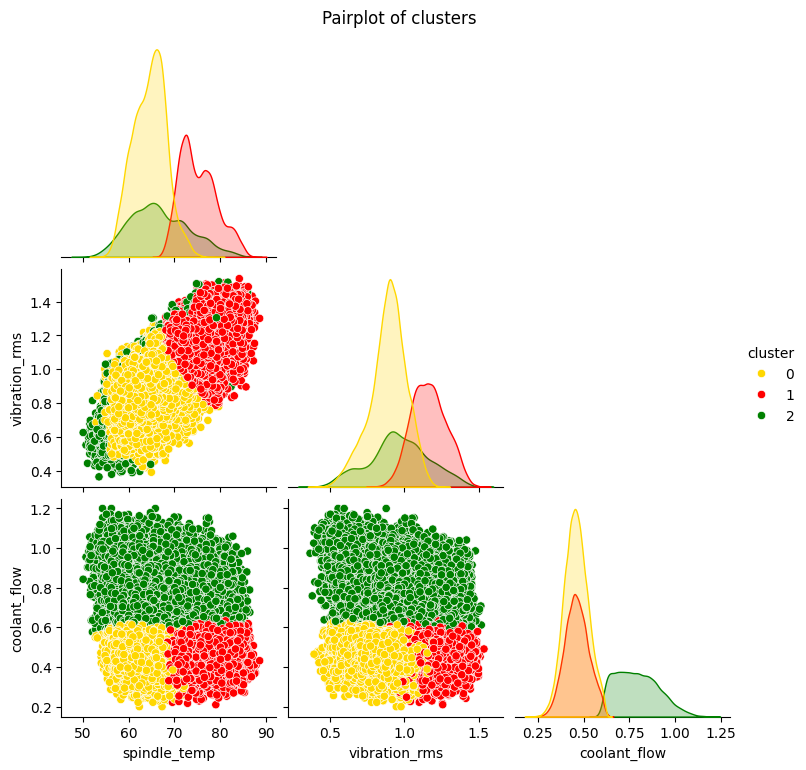

In [7]:
plot_cluster_pairplot(three_clusters, ["spindle_temp", "vibration_rms", "coolant_flow"], three_cluster_palette)

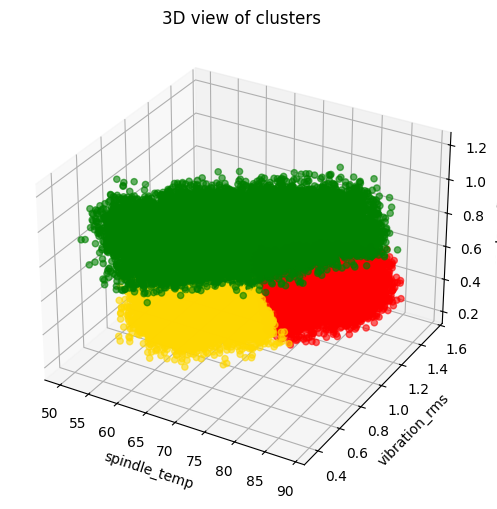

In [8]:
plot_cluster_3d(three_clusters, ["spindle_temp", "vibration_rms", "coolant_flow"], three_cluster_palette)

The clustering results reveal three well-defined operating regimes. The pairplot and 3D visualisation show that coolant flow is the dominant factor separating the regimes. One cluster is characterised by consistently high coolant flow, indicating periods where the cooling system is operating at its most effective capacity. The remaining two clusters occupy the lower coolant band and differ primarily in their vibration and temperature profiles.

Within the low-coolant region, one cluster represents a comparatively stable operating state: vibration levels are lower and temperatures remain within a moderate range. This cluster corresponds to normal mechanical behaviour under mild load. The second cluster within this band reflects a more stressed operating regime, exhibiting higher vibration and elevated spindle temperatures. These patterns suggest greater mechanical resistance or wear, which aligns with states where the system is under increased thermal and mechanical load.

The high-coolant cluster forms a separate regime altogether. Here, coolant flow is substantially higher and the machine appears capable of operating across a wider temperature and vibration range without transitioning into the stressed state. This regime captures periods where the cooling system compensates for mechanical or thermal stress, supporting stable operation.

Overall, the clusters align with meaningful physical interpretations:

- `Cluster 0 (yellow):` low vibration, moderate temperature, low coolant → normal, stable regime.

- `Cluster 1 (red):` high vibration, higher temperature, low coolant → mechanically stressed regime.

- `Cluster 2 (green):` high coolant flow → high-cooling regime with increased resilience.

These observations confirm that the clustering structure captures coherent operating behaviours that can later inform discretisation boundaries and model reasoning. Let's take a look at how these clusters look like when analysed over time.

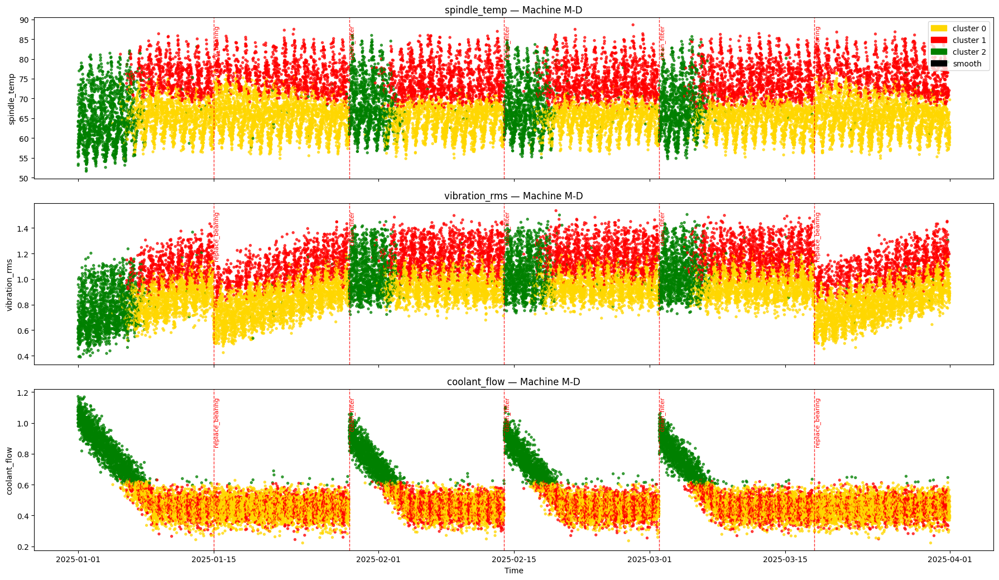

In [9]:
plot_metrics_with_maintenance_and_clusters(
    df=three_clusters,
    maintenance_df=maintenance,
    machine_id="M-D",
    features=["spindle_temp", "vibration_rms", "coolant_flow"],
    cluster_palette=three_cluster_palette
)

When examining the clusters over time and overlaying maintenance events, clear relationships emerge between interventions and subsequent machine behaviour. Coolant-related maintenance actions, such as filter cleaning or coolant refilling, consistently lead to a shift into the high-coolant cluster. Immediately after these interventions, the time series displays pronounced blocks of green points, indicating restored coolant performance. As time progresses following each action, coolant flow gradually decreases and the machine transitions back into lower-coolant clusters. This pattern reflects natural coolant degradation and demonstrates that coolant maintenance has a direct and measurable impact on system behaviour.

Mechanical maintenance, particularly bearing replacements, influences the machine in a different way. Prior to these interventions, the machine spends more time in the high-vibration, high-temperature cluster associated with mechanical stress. Following maintenance, the proportion of points in this stressed regime decreases noticeably, with a corresponding rise in points within the lower-vibration cluster. This suggests that mechanical interventions effectively reduce stress and restore more stable mechanical operation. Although spindle temperature does not change as dramatically as vibration, the shift in cluster distribution clearly indicates improved mechanical conditions.

Across the entire time series, the machine does not drift into any catastrophic regime; instead, it oscillates between the three identified operating states. The clustering therefore captures both the natural cyclical behaviour of the machine and the corrective shifts induced by maintenance. These temporal patterns strongly support the use of cluster-based interpretation for monitoring machine health and provide a meaningful foundation for deriving discretisation rules based on how the system behaves before and after maintenance.

In [10]:
three_clusters["cluster"].value_counts()

cluster
0    50554
1    30072
2    23054
Name: count, dtype: int64

However, looking at the proportions of each cluster, we realize that we have many high-risk cases, which we could associate with spindle overheat. Let's try using 4 clusters to see if we can further restrict this class.

**`4 Clusters`**

In [11]:
four_clusters, _, _, _ = apply_gmm_clustering(merged_data, ["spindle_temp", "vibration_rms", "coolant_flow"], 4)

Cluster centres in original units:
[[63.53540883  0.85486091  0.45677167]
 [70.25710293  1.03336716  0.45658715]
 [66.81815937  0.96295819  0.77596518]
 [77.29666064  1.23561035  0.46898972]]


In [12]:
four_clusters_palette = {
    0: "gold",
    1: "orange",
    2: "green",
    3: "red"
}

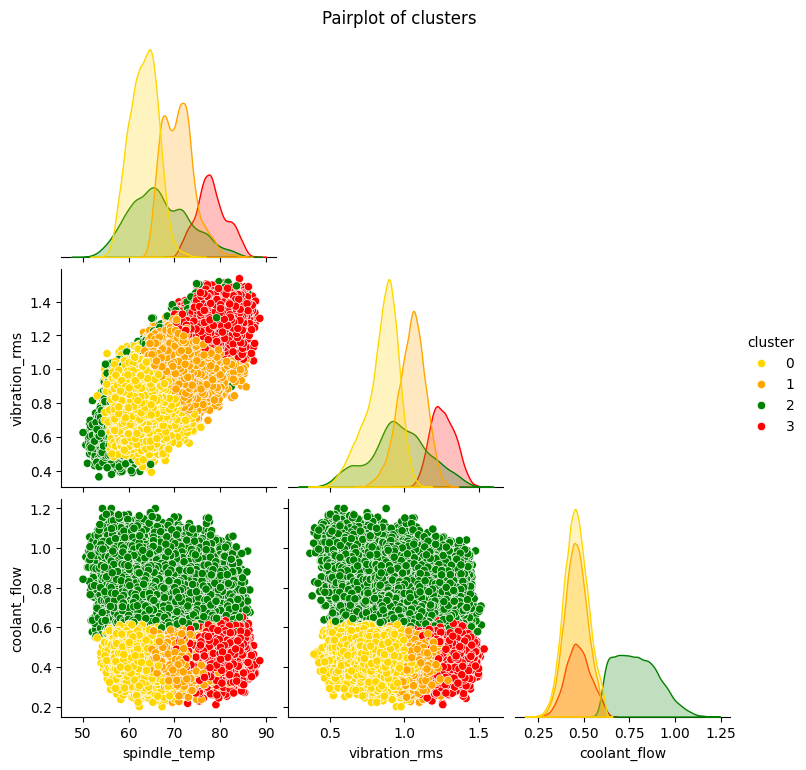

In [13]:
plot_cluster_pairplot(four_clusters, ["spindle_temp", "vibration_rms", "coolant_flow"], four_clusters_palette)

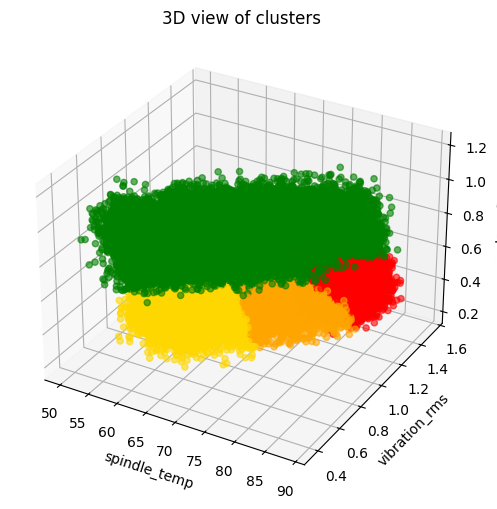

In [14]:
plot_cluster_3d(four_clusters, ["spindle_temp", "vibration_rms", "coolant_flow"], four_clusters_palette)

The four-cluster solution produces a slightly more granular view of the machine’s operating regimes, while retaining the same broad physical structure observed previously. Coolant flow continues to act as the primary separator: one cluster is associated with consistently high coolant levels (green), whereas the remaining three clusters occupy the lower-coolant region.

Within this low-coolant band, the additional split creates two neighbouring clusters (yellow and orange) that represent variations of a similar behavioural regime. Both display moderate spindle temperatures and relatively low vibration, suggesting that they capture subtle differences within what is essentially a stable, low-stress operating state. Because these two clusters overlap significantly in temperature and vibration distributions, it is reasonable to consider merging them into a single “normal/moderate operating regime”.

The red cluster remains clearly distinguishable and represents the high-vibration, higher-temperature regime associated with mechanical stress. 

Finally, the green cluster—characterised by high coolant flow—again forms a distinct high-cooling regime spanning a broad operating envelope.

Overall, the 4-cluster model allowed us to reduce the number of red cases (possible overheat cases) and maintained a stable structure when compared to the 3-cluster model:

- `Clusters 0 & 1 (yellow/orange):` two variants of a normal, low-stress regime.

- `Cluster 2 (green):` high-coolant regime with broader operating tolerance.

- `Cluster 3 (red):` mechanically stressed, higher-vibration regime.

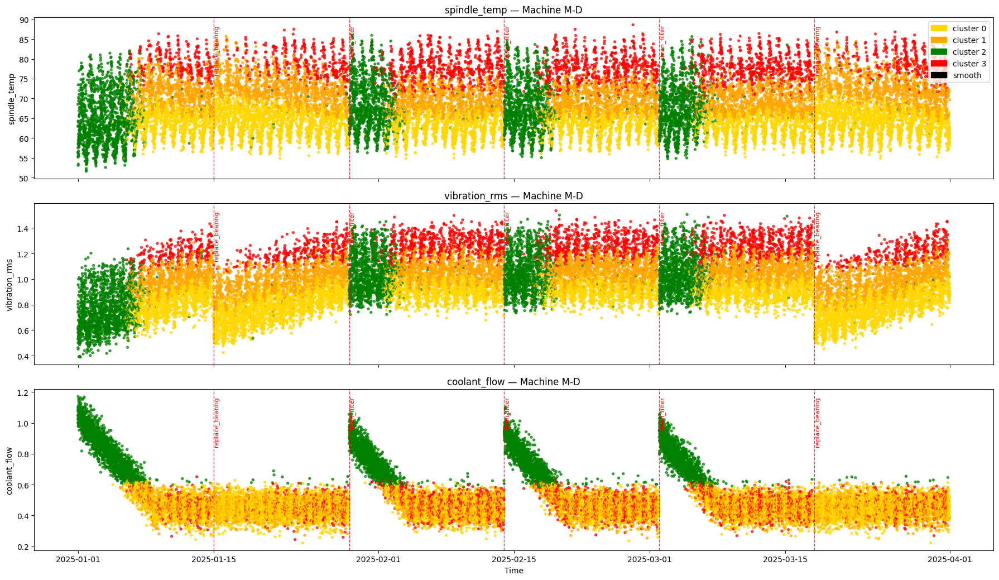

In [15]:
plot_metrics_with_maintenance_and_clusters(
    df=four_clusters,
    maintenance_df=maintenance,
    machine_id="M-D",
    features=["spindle_temp", "vibration_rms", "coolant_flow"],
    cluster_palette=four_clusters_palette
)

In [16]:
four_clusters["cluster"].value_counts()

cluster
0    37007
1    29428
2    23469
3    13776
Name: count, dtype: int64

We definitely obtained more interesting results than when we used all 3 clusters. However, we can combine clusters 0 (yellow) and 1 (orange) since they end up being the same thing, they just helped us reduce the number of red cases.

In [17]:
data = four_clusters.copy()
data["cluster"] = four_clusters["cluster"].replace({0: 1})

In [18]:
data.head()

,machine_id,timestamp,spindle_temp,vibration_rms,coolant_flow,spindle_overheat,cluster
0,M-A,2025-01-01 00:00:00,73.96,0.871,1.050,0,2
1,M-A,2025-01-01 00:05:00,53.38,0.536,1.083,0,2
2,M-A,2025-01-01 00:10:00,58.12,0.455,1.025,0,2
3,M-A,2025-01-01 00:15:00,58.08,0.680,0.977,0,2
4,M-A,2025-01-01 00:20:00,55.37,0.663,1.072,0,2


In [19]:
data["cluster"].value_counts()

cluster
1    66435
2    23469
3    13776
Name: count, dtype: int64

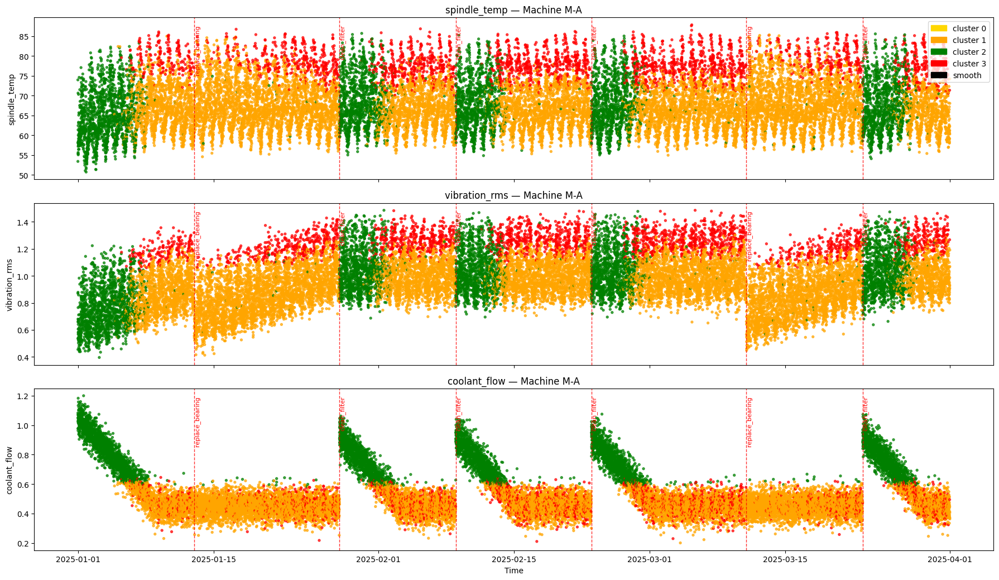

In [20]:
plot_metrics_with_maintenance_and_clusters(
    df=data,
    maintenance_df=maintenance,
    machine_id="M-A",
    features=["spindle_temp", "vibration_rms", "coolant_flow"],
    cluster_palette=four_clusters_palette
)

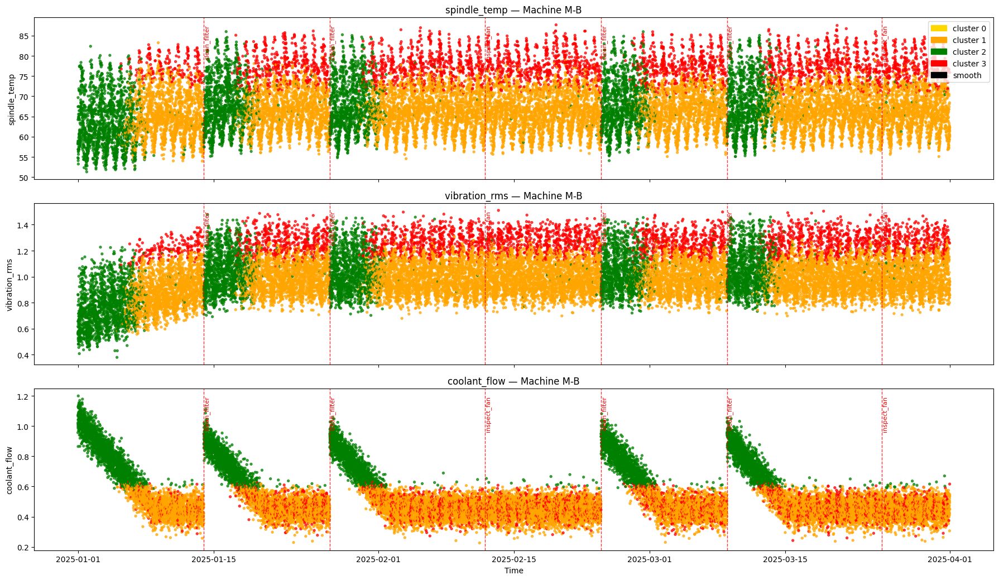

In [21]:
plot_metrics_with_maintenance_and_clusters(
    df=data,
    maintenance_df=maintenance,
    machine_id="M-B",
    features=["spindle_temp", "vibration_rms", "coolant_flow"],
    cluster_palette=four_clusters_palette
)

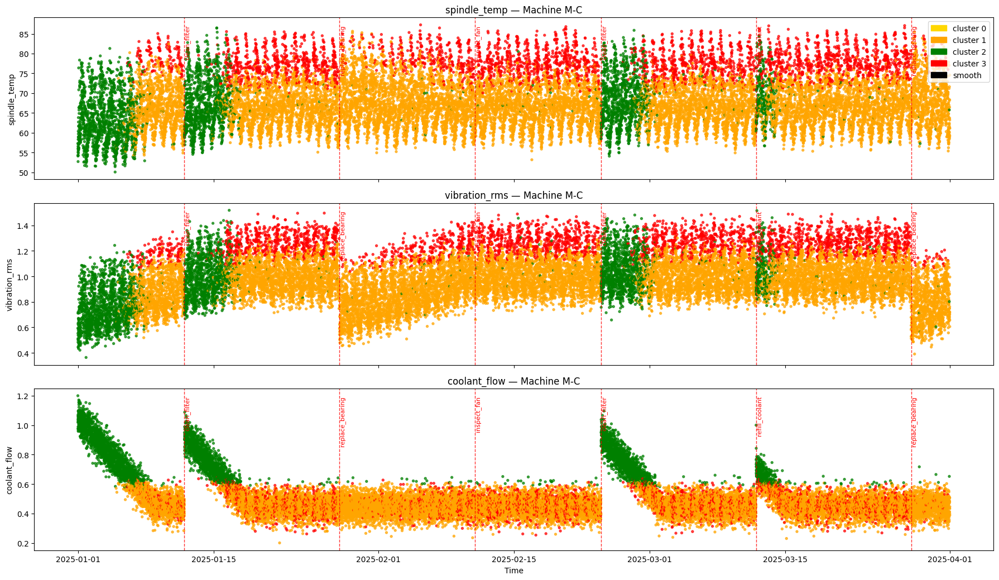

In [22]:
plot_metrics_with_maintenance_and_clusters(
    df=data,
    maintenance_df=maintenance,
    machine_id="M-C",
    features=["spindle_temp", "vibration_rms", "coolant_flow"],
    cluster_palette=four_clusters_palette
)

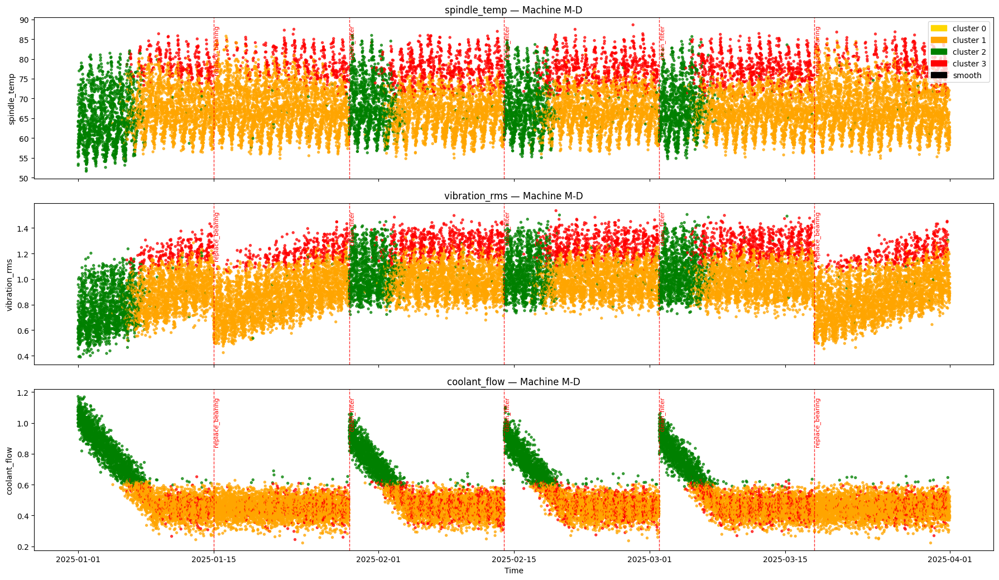

In [23]:
plot_metrics_with_maintenance_and_clusters(
    df=data,
    maintenance_df=maintenance,
    machine_id="M-D",
    features=["spindle_temp", "vibration_rms", "coolant_flow"],
    cluster_palette=four_clusters_palette
)

After merging clusters 0 (yellow) and 1 (orange) into a single operational regime, the temporal behaviour of the machine becomes clearer and easier to interpret. The merged cluster now represents the dominant normal operating state, characterised by moderate spindle temperatures, mid-range vibration levels, and low-to-moderate coolant flow. Across the entire observation period, this merged cluster occupies the majority of data points, confirming that the machine typically operates in a stable and non-critical condition.

Two other regimes remain distinct. The green cluster corresponds to periods of elevated coolant flow, signalling effective cooling immediately following maintenance actions. This pattern is highly consistent: after each coolant-related intervention, the machine enters the high-coolant regime for a short duration before naturally drifting back into the normal operating state as coolant effectiveness gradually decays. The repeated bursts of green following each maintenance event provide strong evidence that the cooling system responds directly to interventions and that its degradation over time is reflected in the transition back to the normal regime.

Conversely, the red cluster captures periods of increased mechanical stress. These intervals are associated with higher vibration levels and elevated spindle temperatures. The temporal plots show that red points become more prevalent in the periods leading up to mechanical maintenance events such as bearing replacements. Following such interventions, the proportion of red points decreases noticeably, indicating a clear reduction in mechanical load and a return toward the normal operating regime. This behaviour confirms that the red cluster is an effective signal of mechanical deterioration and that maintenance actions have a measurable corrective effect.

Overall, after merging the two low-stress clusters, the regime structure becomes highly interpretable:

- `Normal regime (yellow–orange merged):` typical operation, stable temperatures and vibration.

- `High-coolant/Peek regime (green):` short, maintenance-triggered cooling phases that degrade predictably over time.

- `High-stress regime (red):` periods of mechanical strain that diminish after corrective maintenance.

**`Cluster's Analasysis`**

**Although the dataset contains no recorded spindle–overheat events**, **the clustering analysis consistently reveals a distinct high-stress operating regime**, characterised by a combination of **elevated spindle temperature**, **increased vibration levels** and **reduced coolant flow**. This regime (the red cluster) **appears** prominently in the **periods immediately preceding maintenance interventions**, particularly before mechanical repairs such as bearing replacements. Its temporal behaviour suggests that the machine enters this high-stress state when its thermal and mechanical load becomes unsustainable, prompting corrective action.

Interpreting this regime as a proxy for an overheat-risk condition is therefore reasonable. **The red cluster does not represent an actual overheat event, but rather the state in which overheating is most likely to occur if no intervention takes place**. In other words, it **captures the onset of conditions** that precipitate maintenance, and which, if left unresolved, **could plausibly escalate into genuine overheating**. **Using this cluster as the overheat-risk class enables the construction of a supervised label that aligns with the behaviour of the machine, reflects the physical meaning of the variables, and corresponds to the operator’s implicit decision rule for when intervention becomes necessary.**

**`Conclusion`**

Therefore, we have an idea of ​​which values ​​may imply overheating. However, we must also analyze the distribution of the data, both in cluster 3 (most prone to overheating) and in the rest of the data, so that a final decision can be made.

In [24]:
data.query("cluster == 3")[["spindle_temp", "vibration_rms", "coolant_flow"]].describe()

,spindle_temp,vibration_rms,coolant_flow
count,13776.000000,13776.000000,13776.000000
mean,78.025281,1.256741,0.468405
std,3.332219,0.081176,0.067640
min,69.370000,0.991000,0.210000
25%,75.770000,1.197000,0.421000
50%,77.780000,1.252000,0.466000
75%,80.230000,1.316000,0.514000
max,88.620000,1.536000,0.652000


In [25]:
data[["spindle_temp", "vibration_rms", "coolant_flow"]].describe(percentiles=[.01, .05, .10, .25, .50, .75, .90, .95, .99])

,spindle_temp,vibration_rms,coolant_flow
count,103680.000000,103680.000000,103680.000000
mean,68.136173,0.984043,0.532744
std,6.431063,0.185500,0.158853
min,50.080000,0.364000,0.200000
1%,56.310000,0.560000,0.319000
5%,58.750000,0.669000,0.362000
10%,60.210000,0.749000,0.386000
25%,63.317500,0.863000,0.428000
50%,67.220000,0.973000,0.481000
75%,72.580000,1.111000,0.581000


Based on the data, we define the condition for creating overheated cases as:

In [26]:
# critical condition -> overheat candidates
cond = (
    (data["spindle_temp"] > 81) |
    ((data["vibration_rms"] > 1.35) & (data["coolant_flow"] < 0.6))
)

In [27]:
total = len(cond)
qtd = cond.sum()
perc = qtd / total

total, qtd, perc
print(f"Total entries: {total}")
print(f"Critical records: {qtd} ({perc:.4%})")

Total entries: 103680
Critical records: 4746 (4.5775%)


We therefore identified 4746 cases of what could be possible overheating, or very close to it. However, in order to introduce some variability into the data, we decided to do the following:

In [28]:
np.random.seed(42)
mask = cond & (np.random.rand(len(data)) < 0.98)

In [29]:
total = len(data)

qtd_cond = cond.sum()
perc_cond = qtd_cond / total

qtd_mask = mask.sum()
perc_mask = qtd_mask / total

print(f"Total entries: {total}")
print(f"Candidates (cond=True): {qtd_cond} ({perc_cond:.4%})")
print(f"Overheat after sampling (mask=True): {qtd_mask} ({perc_mask:.4%})")

Total entries: 103680
Candidates (cond=True): 4746 (4.5775%)
Overheat after sampling (mask=True): 4662 (4.4965%)


In [30]:
data.loc[mask.values, "spindle_overheat"] = 1

Finally, in order to ensure that the condition did not create completely unrealistic cases, we removed cases in which the coolant flow has high values. In these cases, even if the vibration and temperature are very high, it does not necessarily imply that it is a case of overheat, it is just a peak in operation.

In [31]:
mask = (data["spindle_overheat"] == 1) & (data["coolant_flow"] > 0.60)

idx_to_change = data.loc[mask].sample(frac=0.70, random_state=42).index
data.loc[idx_to_change, "spindle_overheat"] = 0

In [32]:
mask = (data["spindle_overheat"] == 1) & (data["coolant_flow"] > 0.60)
data.loc[mask, "spindle_overheat"] = 0

In [33]:
data.head()

,machine_id,timestamp,spindle_temp,vibration_rms,coolant_flow,spindle_overheat,cluster
0,M-A,2025-01-01 00:00:00,73.96,0.871,1.050,0,2
1,M-A,2025-01-01 00:05:00,53.38,0.536,1.083,0,2
2,M-A,2025-01-01 00:10:00,58.12,0.455,1.025,0,2
3,M-A,2025-01-01 00:15:00,58.08,0.680,0.977,0,2
4,M-A,2025-01-01 00:20:00,55.37,0.663,1.072,0,2


In [34]:
data["spindle_overheat"].value_counts()

spindle_overheat
0    99563
1     4117
Name: count, dtype: int64

In [35]:
from src.bn_data_analysis import *

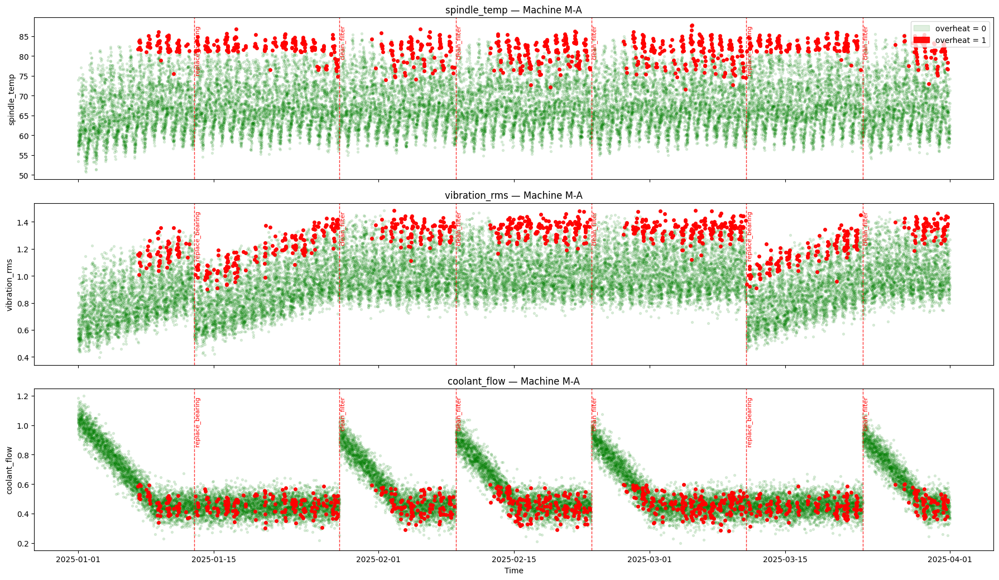

In [36]:
plot_metrics_with_maintenance_and_overheat(
    df=data,
    maintenance_df=maintenance,
    machine_id="M-A",
    features=["spindle_temp", "vibration_rms", "coolant_flow"]
)

In [37]:
data.to_csv("data/data_with_labels.csv", index=False)

We therefore have the labels created and can now analyze how the data distribution turned out in normal cases and in overheat cases.

In [38]:
data.groupby("spindle_overheat")[["spindle_temp"]].describe()

spindle_temp                                            \
                        count       mean       std    min    25%    50%   
spindle_overheat                                                          
0                     99563.0  67.590769  5.935454  50.08  63.13  66.93   
1                      4117.0  81.325902  2.900931  70.12  79.50  82.01   

                                
                    75%    max  
spindle_overheat                
0                 71.95  86.48  
1                 83.34  88.62

In [39]:
data.groupby("spindle_overheat")[["vibration_rms"]].describe()

vibration_rms                                           \
                         count      mean       std    min    25%    50%   
spindle_overheat                                                          
0                      99563.0  0.970704  0.175749  0.364  0.858  0.964   
1                       4117.0  1.306625  0.106024  0.833  1.259  1.339   

                                
                    75%    max  
spindle_overheat                
0                 1.093  1.518  
1                 1.378  1.536

In [40]:
data.groupby("spindle_overheat")[["coolant_flow"]].describe()

coolant_flow                                                  \
                        count      mean       std    min    25%    50%    75%   
spindle_overheat                                                                
0                     99563.0  0.535966  0.160793  0.200  0.429  0.483  0.591   
1                      4117.0  0.454818  0.062612  0.242  0.412  0.453  0.497   

                       
                  max  
spindle_overheat       
0                 1.2  
1                 0.6

# Discretization <a name = "discretization"></a>
[[go back to Index]](#index)

**The clustering step also provides a natural starting point for discretising the continuous sensor variables required by the Bayesian network**. Rather than choosing bin boundaries arbitrarily or purely on statistical criteria, we aim to derive them from the structure revealed by the clusters. To do this, **we plan to train a simple, interpretable decision tree that predicts the cluster assignments from the raw telemetry features**. The **split points learned by this tree suggest meaningful thresholds** in variables such as `spindle temperature`, `vibration` and `coolant flow` that separate different operating regimes. These thresholds can then be used to define discrete states such as “low”, “medium” and “high” for each sensor, ensuring that the discretisation is aligned with the regimes identified in the clustering stage and is therefore more informative for subsequent Bayesian network modelling.

**`Overview of the Data`**

In [41]:
data[["spindle_temp", "vibration_rms", "coolant_flow"]].describe(percentiles=[.01, .05, .10, .25, .50, .75, .90, .95, .99])

,spindle_temp,vibration_rms,coolant_flow
count,103680.000000,103680.000000,103680.000000
mean,68.136173,0.984043,0.532744
std,6.431063,0.185500,0.158853
min,50.080000,0.364000,0.200000
1%,56.310000,0.560000,0.319000
5%,58.750000,0.669000,0.362000
10%,60.210000,0.749000,0.386000
25%,63.317500,0.863000,0.428000
50%,67.220000,0.973000,0.481000
75%,72.580000,1.111000,0.581000


**spindle_temp:** The spindle temperature is centred around ~68°C, with most observations between ~63 and ~73°C.
- Values above ~75°C represent the upper tail and approach the stressed region.
- Values below ~60°C represent a clearly cooler, low-stress region.

**vibration_rms:** The median sits around 0.97.
- Values above ~1.1 represent the upper tail.
- Values below ~0.85 represent a low band.

**coolant_flow:** Has most values between 0.40–0.60.
- Values above ~0.70 probably represent the high-coolant regime we see in clusters, so there is no high stress of the system.
- Values below 0.42 might represent that the system is at risk.

**`Overview of the Data per Cluster`**

In [42]:
data.groupby("cluster")[["spindle_temp", "vibration_rms", "coolant_flow"]].describe()

spindle_temp                                                          \
               count       mean       std    min    25%    50%    75%    max   
cluster                                                                        
1            66435.0  66.565232  4.916690  52.72  62.91  66.26  70.13  85.76   
2            23469.0  66.778344  6.444485  50.08  61.98  66.14  71.27  86.48   
3            13776.0  78.025281  3.332219  69.37  75.77  77.78  80.23  88.62   

        vibration_rms            ...               coolant_flow            \
                count      mean  ...    75%    max        count      mean   
cluster                          ...                                        
1             66435.0  0.935745  ...  1.042  1.327      66435.0  0.456220   
2             23469.0  0.960695  ...  1.095  1.518      23469.0  0.787133   
3             13776.0  1.256741  ...  1.316  1.536      13776.0  0.468405   

                                                      
              std    min    25%    50%    75%    max  
cluster                                               
1        0.062968  0.200  0.413  0.455  0.499  0.633  
2        0.117683  0.557  0.690  0.778  0.871  1.200  
3        0.067640  0.210  0.421  0.466  0.514  0.652  

[3 rows x 24 columns]

**Note: `culster 1 = yellow (moderate)`, `cluster 2 = green (no risk)`, `cluster 3 = red (high risk)`**

Analysis of the three key variables (spindle temperature, vibration RMS, and coolant flow) shows that the clusters learned by the model align naturally with meaningful operational regimes.

The high-risk cluster (red) is characterised by markedly higher spindle temperatures and vibration levels, while coolant flow remains low. These values consistently exceed the 75th percentile of the moderate and no-risk regimes, making this cluster a strong indicator of conditions that precede maintenance interventions and could plausibly escalate into an overheat event.

The moderate cluster (yellow) represents normal operating behaviour under insufficient coolant levels: temperature and vibration are within typical ranges, but the system lacks cooling margin, meaning it could deteriorate into the high-risk state if stress increases.

The no-risk cluster (green) differs primarily through its substantially higher coolant flow, which offsets moderate temperature or vibration fluctuations. This regime reflects stable, well-cooled machine behaviour.

Given these distinctions, the clusters provide a reliable foundation for defining Low, Moderate, and High discretisation thresholds. They also justify treating the high-risk cluster as an analogue for the overheat class: although no true overheat events occur in the dataset, this cluster captures the combination of stress indicators that lead to maintenance and would likely precede an actual overheating scenario if left unaddressed.

**`Sorrugate Model - Decision Tree`**

In [43]:
rules, tree = extract_cluster_rules(df=data, features=["spindle_temp", "vibration_rms", "coolant_flow"])


=========== Surrogate Model Rules ===========

|--- coolant_flow <= 0.61
|   |--- vibration_rms <= 1.16
|   |   |--- spindle_temp <= 76.63
|   |   |   |--- class: 1
|   |   |--- spindle_temp >  76.63
|   |   |   |--- class: 1
|   |--- vibration_rms >  1.16
|   |   |--- spindle_temp <= 73.12
|   |   |   |--- class: 1
|   |   |--- spindle_temp >  73.12
|   |   |   |--- class: 3
|--- coolant_flow >  0.61
|   |--- coolant_flow <= 0.62
|   |   |--- spindle_temp <= 75.52
|   |   |   |--- class: 2
|   |   |--- spindle_temp >  75.52
|   |   |   |--- class: 3
|   |--- coolant_flow >  0.62
|   |   |--- coolant_flow <= 0.64
|   |   |   |--- class: 2
|   |   |--- coolant_flow >  0.64
|   |   |   |--- class: 2




The surrogate decision tree **reveals a coherent and physically meaningful structure behind the clustering results**. The model identifies coolant flow as the dominant variable governing the machine’s operating regime: **low coolant consistently increases the likelihood of entering higher-stress states**, while sufficiently high coolant provides strong protection across all conditions.

Within the low-coolant regime, two additional factors determine the risk level. **High vibration combined with elevated spindle temperature reliably marks the transition into the high-risk** (red) state, whereas **lower vibration or moderate temperature keeps the system in a stable, moderate regime**.

When coolant **flow is above the threshold, the system remains almost exclusively in the no-risk (green) state**. Only when **coolant is just marginally above the cut-point and spindle temperature exceeds approximately 75°C does the model classify the situation as high-risk**. This highlights that **extreme temperatures can override partial cooling safety margins**.

Overall, the surrogate model captures intuitive rules:

- High-risk occurs when cooling is inadequate and mechanical stress is high.

- Moderate behaviour dominates when stress is present but not extreme.

- No-risk is associated with consistently high coolant flow.

These data-driven thresholds provide a sound basis for discretising the variables and support the interpretation of the high-risk cluster as a valid proxy for an overheat-prone operational state.

**`Conclusion`**

**Spindle Temperature**
- Low: ≤ 65 °C
- Moderate: 65–81 °C
- High: > 81 °C

**Vibration RMS**
- Low: ≤ 0.90
- Moderate: 0.90–1.32
- High: > 1.32

**Coolant Flow**
- Low: < 0.45
- Moderate: 0.45–0.80
- High: ≥ 0.80

The thresholds selected for discretising spindle temperature, vibration and coolant flow are derived from three complementary sources: the statistical distribution of the data, the structure revealed by the clustering, and the numerical splits identified by the surrogate decision tree. Each of these provides guidance on where transitions between operating regimes occur, but none of them impose strict, physically fixed boundaries. Instead, they highlight zones where behaviour changes in a meaningful way.

For this reason, it is entirely acceptable to adjust the thresholds slightly, rounding them to clearer, more interpretable values, without compromising their validity. Minor shifts remain within the same behavioural region identified by the clusters and the model. In practice, such adjustments improve clarity and communicability while maintaining consistency with the underlying data patterns.

These small changes also do not create issues for the overheat-risk label. This label does not depend on a single metric crossing an exact numerical point. Instead, it reflects the combination of high temperature, high vibration and low coolant that characterises the high-stress cluster. As long as the thresholds continue to separate the same broad operating regimes (normal, moderate and high risk) the definition of the label remains stable. The Bayesian network or any downstream model will still learn the correct relationships because the discretised states preserve the essential structure of the machine’s behaviour.

In [ ]:
# Temperatura
data["spindle_temp_disc"] = pd.cut(
    data["spindle_temp"],
    bins=[-np.inf, 65, 81, np.inf],
    labels=["low", "moderate", "high"],
    right=True,         # (-inf,65], (65,81], (81,inf)
    include_lowest=True
)

# Vibração
data["vibration_rms_disc"] = pd.cut(
    data["vibration_rms"],
    bins=[-np.inf, 0.90, 1.32, np.inf],
    labels=["low", "moderate", "high"],
    right=True,         # (-inf,0.90], (0.90,1.32], (1.32,inf)
    include_lowest=True
)

# Coolant flow
data["coolant_flow_disc"] = pd.cut(
    data["coolant_flow"],
    bins=[-np.inf, 0.45, 0.80, np.inf],
    labels=["low", "moderate", "high"],
    right=False         # [-inf,0.45), [0.45,0.80), [0.80,inf)
)

In [45]:
data.head()

,machine_id,timestamp,spindle_temp,vibration_rms,coolant_flow,spindle_overheat,cluster,spindle_temp_disc,vibration_rms_disc,coolant_flow_disc
0,M-A,2025-01-01 00:00:00,73.96,0.871,1.050,0,2,moderate,low,high
1,M-A,2025-01-01 00:05:00,53.38,0.536,1.083,0,2,low,low,high
2,M-A,2025-01-01 00:10:00,58.12,0.455,1.025,0,2,low,low,high
3,M-A,2025-01-01 00:15:00,58.08,0.680,0.977,0,2,low,low,high
4,M-A,2025-01-01 00:20:00,55.37,0.663,1.072,0,2,low,low,high


In [46]:
bn_data = data[["spindle_temp_disc", "vibration_rms_disc", "coolant_flow_disc", "spindle_overheat"]]

In [47]:
bn_data["spindle_temp_disc"].value_counts()

spindle_temp_disc
moderate    63947
low         36279
high         3454
Name: count, dtype: int64

In [48]:
bn_data["vibration_rms_disc"].value_counts()

vibration_rms_disc
moderate    65050
low         34501
high         4129
Name: count, dtype: int64

In [49]:
bn_data["coolant_flow_disc"].value_counts()

coolant_flow_disc
moderate    57029
low         36337
high        10314
Name: count, dtype: int64

---
---

In [50]:
pd.crosstab(data["coolant_flow_disc"], data["spindle_overheat"])

spindle_overheat,0,1
coolant_flow_disc,,
low,34378,1959
moderate,54871,2158
high,10314,0


In [51]:
pd.crosstab(data["spindle_temp_disc"], data["spindle_overheat"])

spindle_overheat,0,1
spindle_temp_disc,,
low,36279,0
moderate,62674,1273
high,610,2844


In [52]:
pd.crosstab(data["vibration_rms_disc"], data["spindle_overheat"])

spindle_overheat,0,1
vibration_rms_disc,,
low,34497,4
moderate,63279,1771
high,1787,2342


Analyzing the discretization by cluster 3, because we define cluster 3 as overheat, the values ​​make sense. There are no cases of overheat where spindle_temp is low nor cases where vibration_rsm is low. This makes perfect sense. However, there are cases where coolant_flow is high, which makes sense if vibration_rms and spindle_temp are both high.

In [53]:
bn_data = bn_data.rename(columns={
    "spindle_temp_disc": "spindle_temp",
    "vibration_rms_disc": "vibration_rms",
    "coolant_flow_disc": "coolant_flow"
})

In [54]:
bn_data.head()

,spindle_temp,vibration_rms,coolant_flow,spindle_overheat
0,moderate,low,high,0
1,low,low,high,0
2,low,low,high,0
3,low,low,high,0
4,low,low,high,0


In [55]:
bn_data.to_csv("data/data_with_labels_and_discretized.csv", index=False)